# Existing Technology

[UXSim](https://toruseo.jp/UXsim/docs/index.html) - A Macroscopic traffic modelling software out of Japan that can quickly perform simulations on networks built off exisiting GIS Data

In [1]:
from uxsim import *

W = World(
    name="",
    deltan=30,  # for huge scale simulation (e.g., 100000+ vehicles or 1000+ links), large deltan is recommended.
    tmax=10000,
    print_mode=1,
    save_mode=1,
    show_mode=1,
    random_seed=42,
)

W.load_scenario("res/chicago_sketch.uxsim_scenario")

W.exec_simulation()
W.analyzer.print_simple_stats()

loading scenario from 'res/chicago_sketch.uxsim_scenario'
 DATA SOURCE AND LICENCE : Chicago-Sketch network. This is based on https://github.com/bstabler/TransportationNetworks/tree/master/Chicago-Sketch by Transportation Networks for Research Core Team. Users need to follow their licence. Especially, this data is for academic research purposes only, and users must indicate the source of any dataset they are using in any publication that relies on any of the datasets provided in this web site.
 Number of loaded nodes: 546
 Number of loaded links: 2176
 Number of loaded `adddemand`s: 8406
simulation setting:
 scenario name: 
 simulation duration:	 10000 s
 number of vehicles:	 968520 veh
 total road length:	 12115219.047323605 m
 time discret. width:	 30 s
 platoon size:		 30 veh
 number of timesteps:	 333
 number of platoons:	 32284
 number of links:	 2176
 number of nodes:	 546
 setup time:		 2.68 s
simulating...
      time| # of vehicles| ave speed| computation time
       0 s|      

 generating animation...


  0%|          | 0/167 [00:00<?, ?it/s]

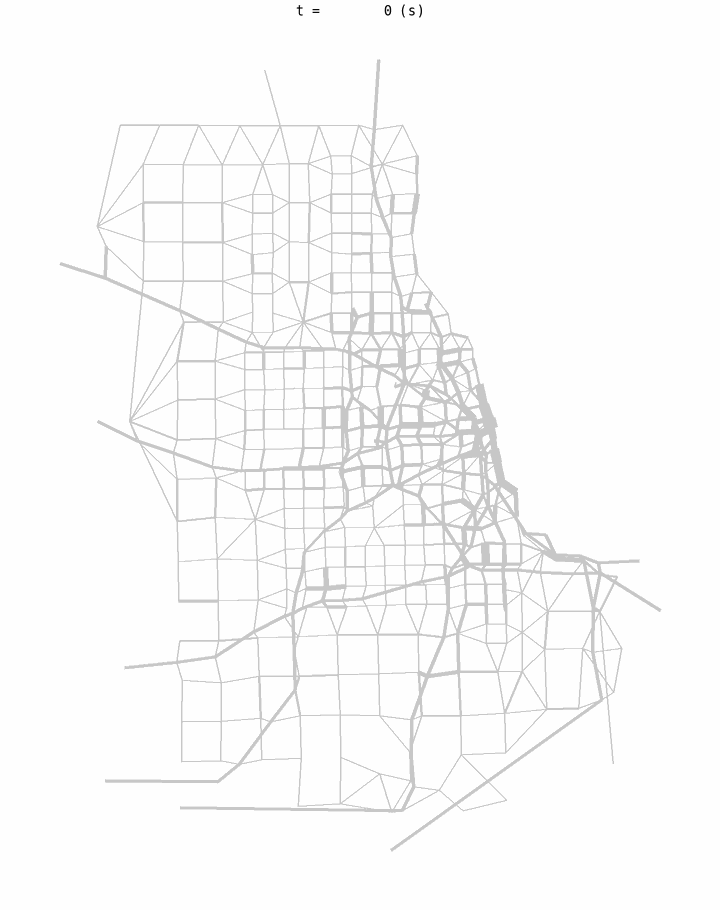

In [2]:
W.analyzer.network_fancy(
    animation_speed_inverse=10,
    sample_ratio=0.2,
    interval=5,
    trace_length=10,
    figsize=6,
    antialiasing=True,
)
display_image_in_notebook("out/anim_network_fancy.gif")

## Generating Network Maps from OpenStreetMaps

In [3]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [4]:
W = World(
    name="", deltan=5, tmax=7200, print_mode=1, save_mode=1, show_mode=0, random_seed=0
)

In [7]:
from uxsim.OSMImporter import *

### Columbus

In [22]:
nodes, links = OSMImporter.import_osm_data(
    north=40.25,
    south=39,
    east=-82.8,
    west=-83.3,
    custom_filter='["highway"~"motorway"]',
)

Start downloading OSM data. This may take some time.


Download completed
imported network size:
 number of links: 1290
 number of nodes: 1052


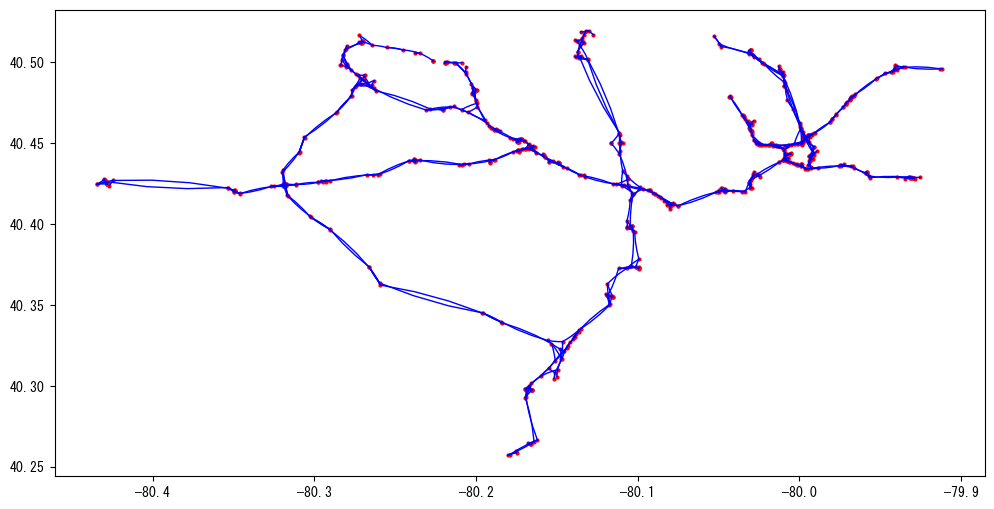

In [39]:
OSMImporter.osm_network_visualize(nodes, links, show_link_name=0)

### Cleveland

In [40]:
nodes, links = OSMImporter.import_osm_data(
    north=43.5,
    south=41.33,
    east=-81.4,
    west=-81.9,
    custom_filter='["highway"~"motorway"]',
)

Start downloading OSM data. This may take some time.


Download completed
imported network size:
 number of links: 1055
 number of nodes: 894


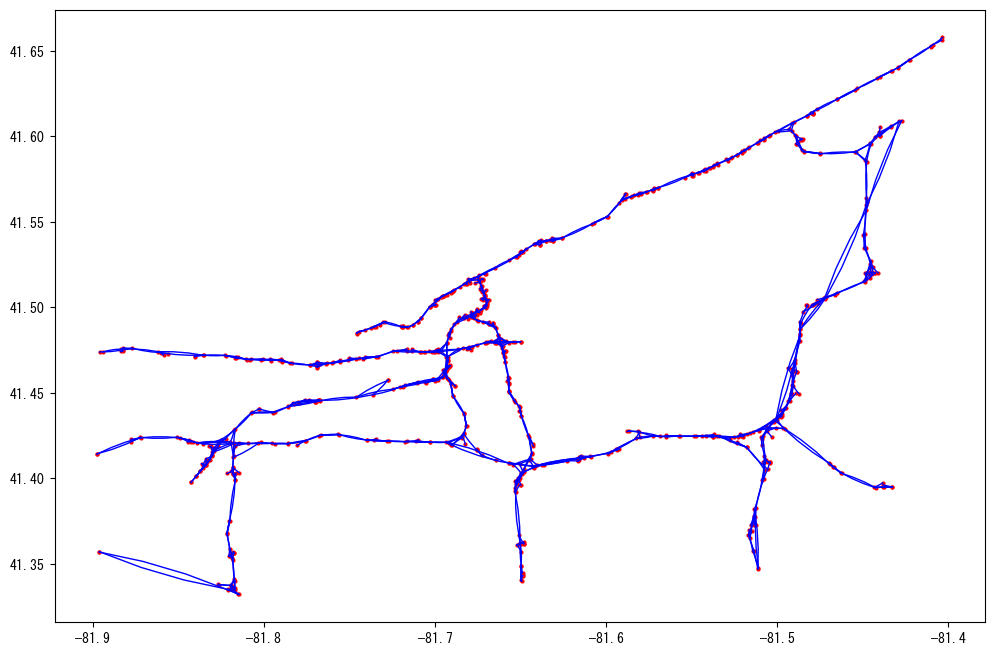

In [41]:
OSMImporter.osm_network_visualize(nodes, links, show_link_name=0)

### Pittsburgh

In [42]:
nodes, links = OSMImporter.import_osm_data(
    north=40.52,
    south=40.25,
    east=-79.91,
    west=-80.5,
    custom_filter='["highway"~"motorway"]',
)

Start downloading OSM data. This may take some time.


Download completed
imported network size:
 number of links: 846
 number of nodes: 725


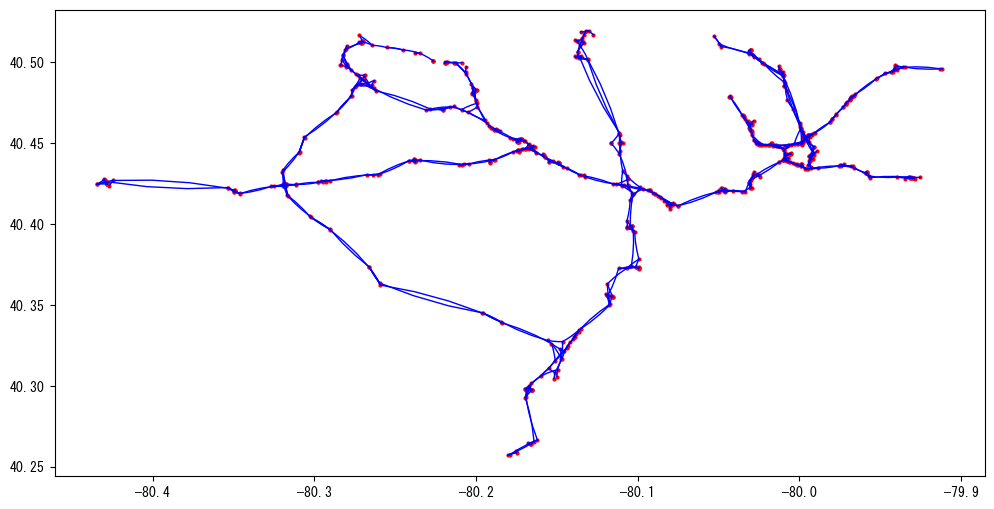

In [43]:
OSMImporter.osm_network_visualize(nodes, links, show_link_name=0)

## Truck Volume Data

FHWA Collects and distributes Freight analysis data.

[FHWA Data](https://ops.fhwa.dot.gov/freight/freight_analysis/faf/index.htm)

This can be plugged into the traffic modeller and compared for any origin/destination pair

### Rail Network Maps

Rail network maps are avaialable as part of the [OpenRailMaps](https://www.openrailwaymap.org/) initiative. However the data could be significantly improved for the US.

# Combining

Utilizing Truck Traffic current and forecasts, we can anticipate areas where the railroad's could potentially see an increased demand for freight shipping. This would help to determine areas to expand, build out intermodal terminals, etc.

Would also help to prioritize maintainance tasks like production track work, bridge rehabs and repairs etc.